<a href="https://colab.research.google.com/github/CarmemMarinho/poscienciasdedados/blob/main/MVP_Sprint2_ParteB_V3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MVP de Machine Learning e Deep Learning
Profs. Hugo Villamizar e Patrick Happ

Aluna: Carmem Maria Marinho de Souza Vasconcelos

## Parte B - Deep Learning - Problema de visão computacional

**Classificador de imagens binárias - Human x Horse**

**Contexto**: Horses or Humans é um conjunto de dados de imagens 300 × 300, criado por Laurence Moroney. O conjunto contém 500 imagens de várias espécies de cavalos e 527 imagens de humanos, renderizadas  e  em várias poses em vários locais. Para garantir a diversidade dos humanos e, para esse fim, há homens e mulheres, bem como asiáticos, negros, sul-asiáticos e caucasianos presentes no conjunto de treinamento. O conjunto de validação adiciona 6 figuras diferentes de diferentes gêneros, raças e poses para garantir a amplitude dos dados.
O conjunto de imagens de treinamento e validação estavam separados em pastas. Para trabalhar com esse dataset neste notebook, foi realizada a compactação dos arquivos e o upload no google drive, em seguida os arquivos foram carregados para este notebook, armazenados na pasta imagem e descompactados.
O objetivo deste notebook é criar um modelo de visão computacional que consiga classificar uma imagem dentre essas categorias.

**Estrutura**: O notebook está dividido assim:

- Importação das bibliotecas

- Acesso e tratamento dos dados que serão a entrada do modelo de deep learning

- Configuração do modelo de deep learning usando uma rede neural convolucional (CNN) simples com Keras

- Treinamento do modelo de deep learning

- Execução do modelo de deep learning treinado

- Avaliação do modelo de deep learning

- Exportação do modelo de deep learning

- Teste do modelo exportado

**Dataset**: O dataset foi baixado do Kaggle, uma plataforma online voltada para cientistas de dados, entusiastas de aprendizado de máquina e profissionais afins. O uso é estritamente didático. Para mais informações sobre o dataset, veja o link a seguir: https://www.kaggle.com/datasets/sanikamal/horses-or-humans-dataset.

### 1. Importando as bibliotecas necessárias para executar o notebook

Vamos iniciar importanto as bibliotecas que usaremos ao longo do projeto

In [1]:
#Importa os pacotes
import os
import numpy as np
import pandas as pd
import gdown
import shutil
import random
import math
import zipfile
import tensorflow as tf
import sklearn.metrics as skm
from zipfile import ZipFile
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from IPython.display import Image, display
from datetime import datetime
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import itertools
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras import layers
from keras import models
from keras import optimizers

In [2]:
# imprime matriz de confusão
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

### 2. Acessando e tratando os dados que serão a entrada do modelo de deep learning

Nessa etapa faremos a carga dos arquivos do dataset utilizado. Neste caso, as imagens não estão organizadas em pastas que representam cada classe rotulada (label). Temos um arquivo .zip que precisa ser extraído e que está localizado no google drive.

In [3]:
# download do dataset de treinamento
file_id = "1DG7FLHW3PwQqQSxNRZ_BJZTzxP_7UOr2"
url = f"https://drive.google.com/uc?id={file_id}"


folder_path = "./dataset"  # especifique a pasta onde baixara o arquivo
os.makedirs(folder_path, exist_ok=True) # cria a pasta de destino se necessário

output = "dataset/train.zip"  # especifique o nome do arquivo e a extensão do mesmo
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=1DG7FLHW3PwQqQSxNRZ_BJZTzxP_7UOr2
To: /content/dataset/train.zip
100%|██████████| 150M/150M [00:03<00:00, 40.4MB/s]


'dataset/train.zip'

In [4]:
# extraindo imagens do arquivo zip
destination = 'dataset/images/' # path onde se encontra o arquivo 'train.zip'

os.makedirs(destination,exist_ok=True) # cria a pasta de destino se necessário

with zipfile.ZipFile(output,'r') as zip_ref:
    zip_ref.extractall(destination)

In [5]:
# download do dataset de validação
file_id = "1tw_vFT_Gvi54jTiFTmtwy9VibacT3_PA"
url = f"https://drive.google.com/uc?id={file_id}"


folder_path = "./dataset"  # especifique a pasta onde baixara o arquivo
os.makedirs(folder_path, exist_ok=True) # cria a pasta de destino se necessário

output = "dataset/valid.zip"  # especifique o nome do arquivo e a extensão do mesmo
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?id=1tw_vFT_Gvi54jTiFTmtwy9VibacT3_PA
To: /content/dataset/valid.zip
100%|██████████| 11.5M/11.5M [00:00<00:00, 76.9MB/s]


'dataset/valid.zip'

In [6]:
# extraindo imagens do arquivo zip
destination = 'dataset/images/' # path onde se encontra o arquivo 'valid.zip'

with zipfile.ZipFile(output,'r') as zip_ref:
    zip_ref.extractall(destination)

Verificando a pasta que foi extraída do .zip

In [7]:
# mostra os arquivos extraidos
r='dataset/images/'
print(os.listdir(r))

['horse10-9.png', 'human01-16.png', 'human13-08.png', 'human05-10.png', 'human05-17.png', 'horse29-6.png', 'horse27-1.png', 'horse24-3.png', 'human08-19.png', 'human09-21.png', 'human06-02.png', 'horse49-0.png', 'human11-13.png', 'human03-13.png', 'human06-13.png', 'horse49-6.png', 'horse3-099.png', 'horse25-5.png', 'human11-05.png', 'human17-18.png', 'horse28-7.png', 'human11-26.png', 'human14-22.png', 'horse06-5.png', 'human03-14.png', 'human03-12.png', 'human01-00.png', 'human13-16.png', 'human08-05.png', 'horse36-4.png', 'horse36-2.png', 'horse48-9.png', 'human13-24.png', 'horse47-4.png', 'human15-12.png', 'human09-19.png', 'horse03-7.png', 'human07-20.png', 'horse48-1.png', 'horse1-204.png', 'horse42-1.png', 'human01-07.png', 'human06-25.png', 'human13-28.png', 'horse2-040.png', 'horse1-335.png', 'human12-09.png', 'horse3-255.png', 'horse23-3.png', 'human17-21.png', 'horse18-7.png', 'human08-17.png', 'human12-19.png', 'horse45-8.png', 'human11-17.png', 'horse1-411.png', 'horse21-7

Verificando o número de imagens que foram extraídas

In [8]:
# mostra o número total de imagens
path='dataset/images/'
print(f"Temos um total de {len(os.listdir(path))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 1155 imagens para o treinamento e avaliação do modelo de deep learning


Exemplos de algumas imagens extraídas

In [9]:
# apresenta as 20 primeiras imagens
print(f"Primeiras 20 imagens: \n {os.listdir(path)[:20]}")

Primeiras 20 imagens: 
 ['horse10-9.png', 'human01-16.png', 'human13-08.png', 'human05-10.png', 'human05-17.png', 'horse29-6.png', 'horse27-1.png', 'horse24-3.png', 'human08-19.png', 'human09-21.png', 'human06-02.png', 'horse49-0.png', 'human11-13.png', 'human03-13.png', 'human06-13.png', 'horse49-6.png', 'horse3-099.png', 'horse25-5.png', 'human11-05.png', 'human17-18.png']


Agora, vamos criar um dataset com as informações das imagens

In [10]:
images =os.listdir(path)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    labels.append(str(fname)[:5])
    img_shape = mpimg.imread(path+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

In [11]:
# mostra o dataset criado
df.head()

,images,class,height,width,channels,filesize
0,horse10-9.png,horse,300,300,4,165021
1,human01-16.png,human,300,300,4,37988
2,human13-08.png,human,300,300,4,155490
3,human05-10.png,human,300,300,4,36284
4,human05-17.png,human,300,300,4,38905


Vamos visualizar a comparação do número de imagens de cada classe

horse    628
human    527
Name: class, dtype: int64


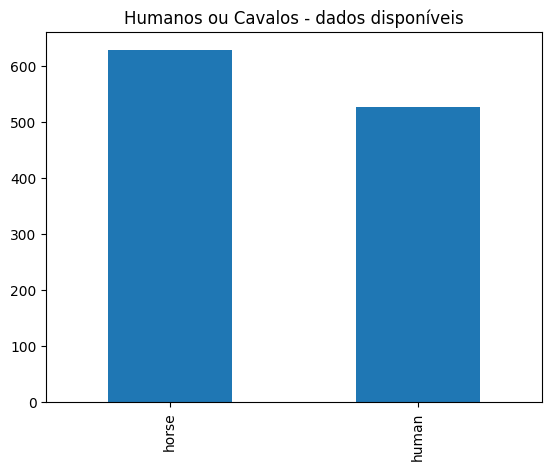

In [12]:
# mostra a quantidade de imagens por classe
print((df['class']).value_counts())
humanORhorse_count = df['class'].value_counts().plot.bar(title='Humanos ou Cavalos - dados disponíveis')

E agora vamos visualizar algumas imagens do conjunto de dados

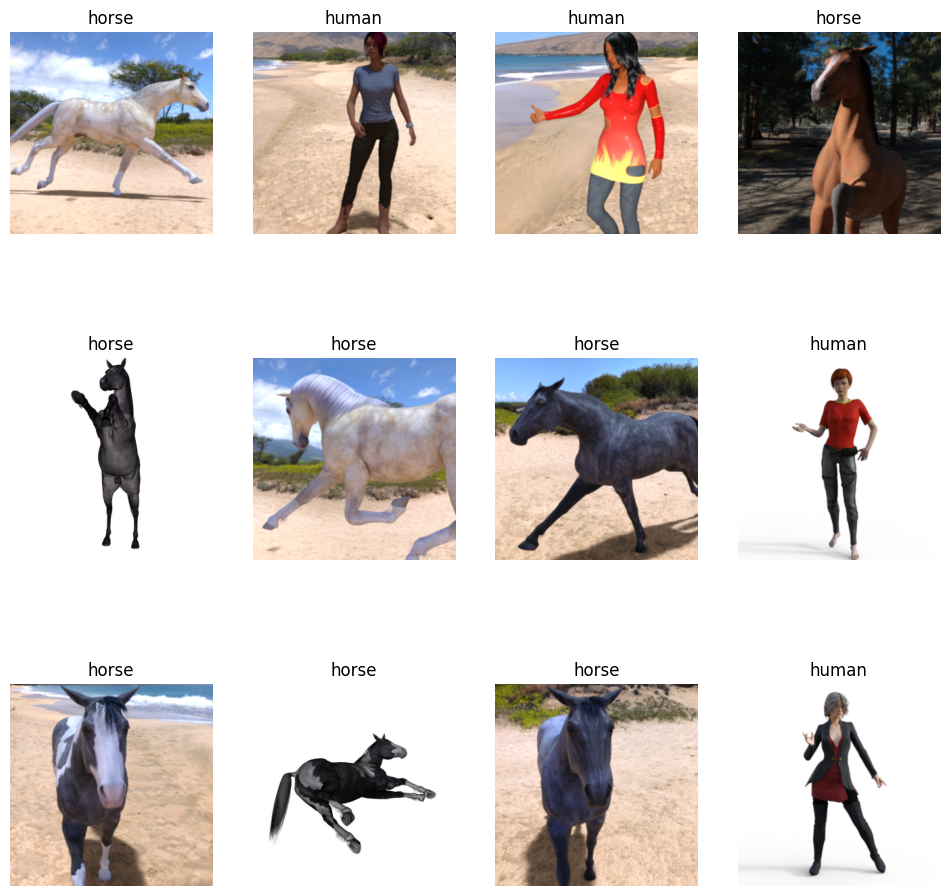

In [13]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:5])

plt.show()

Nessa etapa, faremos a divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Os conjuntos não devem poussir nenhum elemento em comum.

In [14]:
# definindo dados de treino e teste
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.3 ,random_state=42 , shuffle=True)

In [15]:
# mostra a divisão dos dados
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
              images  class
261    horse47-2.png  horse
930   human09-30.png  human
599    horse20-7.png  horse
339    horse09-6.png  horse
617    horse16-4.png  horse
...              ...    ...
1044  human16-02.png  human
1095  human16-25.png  human
1130   horse08-1.png  horse
860   human12-06.png  human
1126  human16-20.png  human

[808 rows x 2 columns]
##### Test: #####
              images  class
964   human08-23.png  human
265    horse04-1.png  horse
109   human15-20.png  human
299   human12-27.png  human
844    horse15-4.png  horse
...              ...    ...
654    horse40-7.png  horse
701   human16-05.png  human
545   human11-20.png  human
1058   horse32-3.png  horse
1127  human05-11.png  human

[347 rows x 2 columns]


**Preparação dos dados**

A seguir utilizaremos o ImageDataGenerator para aumentar e pré-processar dados de imagens durante o treinamento do modelo, para separar um conjunto de validação com 20% das amostras do conjunto de treino.

Importante ressaltar que o pré-processamento do teste não evolve o aumento de dados.

In [16]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=32,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=32,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=32,
    class_mode='binary',
    x_col='images',
    y_col='class',
    shuffle=False)

Found 647 validated image filenames belonging to 2 classes.
Found 161 validated image filenames belonging to 2 classes.
Found 347 validated image filenames belonging to 2 classes.


Agora faremos do tratamento das imagens

Found 1 validated image filenames belonging to 1 classes.


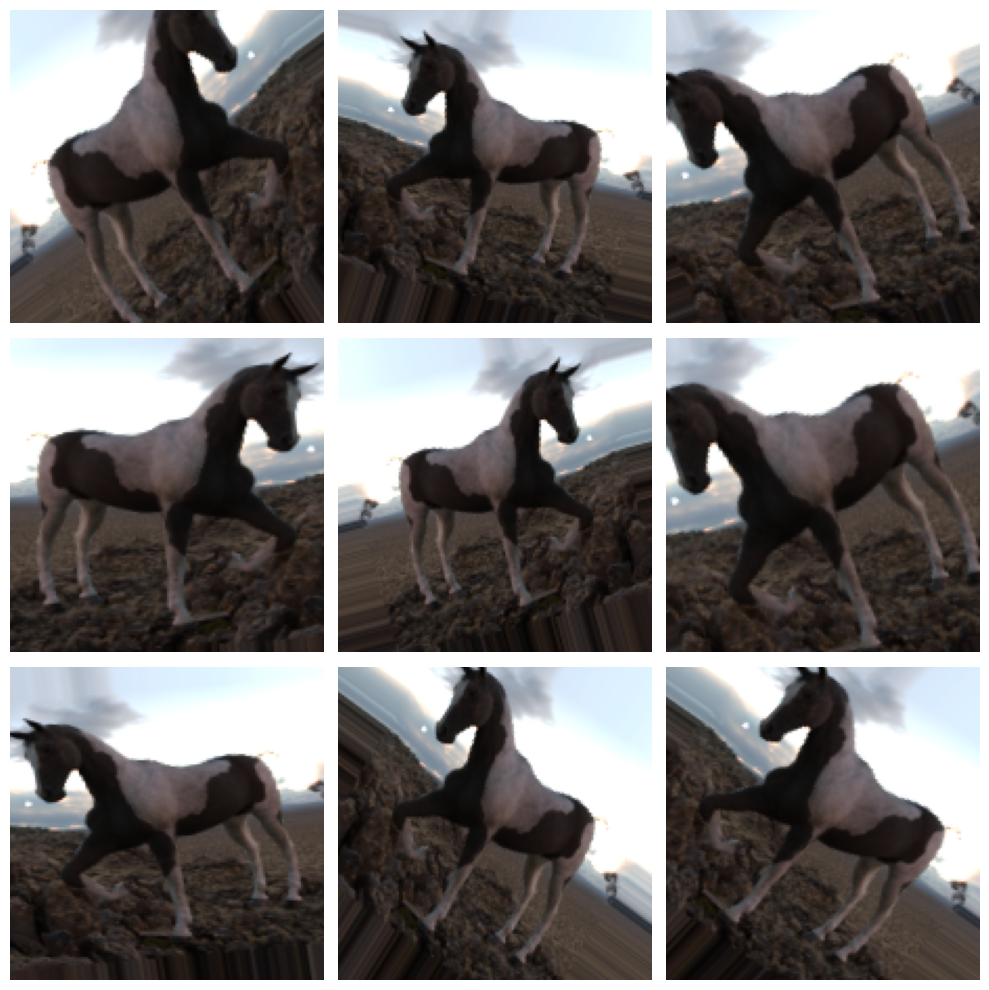

In [17]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

###3. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras

**Definição da arquitetura do modelo**

Aqui é especificada uma camada convolucional 2D que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação ReLU. O parâmetro input_shape define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas max-pooling com a mesma função de ativação.

In [18]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [19]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

O método summary() é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

### 4. Treinamento do modelo de deep learning

Compilação do modelo Keras com as configurações do treinamento

In [21]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método fit_generator() inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento train_generator e o gerador de dados de validação val_generator. Os números de steps_per_epoch e validation_steps foram definidos dividindo a quantidade de imagens pelo tamanho de bach (bach_size):

train = 647/32 = 20

valid = 161/32 = 5

In [22]:
history=model.fit_generator(train_generator ,
                            steps_per_epoch=20,
                            epochs=10 ,
                            validation_data=val_generator ,
                            validation_steps=5)

<ipython-input-22-c24134459324>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator ,


Epoch 1/10
20/20 [==============================] - 27s 1s/step - loss: 0.6216 - accuracy: 0.6228 - val_loss: 0.4354 - val_accuracy: 0.8562
Epoch 2/10
20/20 [==============================] - 25s 1s/step - loss: 0.3527 - accuracy: 0.8667 - val_loss: 0.3534 - val_accuracy: 0.9000
Epoch 3/10
20/20 [==============================] - 25s 1s/step - loss: 0.3513 - accuracy: 0.8699 - val_loss: 0.2522 - val_accuracy: 0.8938
Epoch 4/10
20/20 [==============================] - 25s 1s/step - loss: 0.2701 - accuracy: 0.8992 - val_loss: 0.2163 - val_accuracy: 0.9375
Epoch 5/10
20/20 [==============================] - 25s 1s/step - loss: 0.2299 - accuracy: 0.9203 - val_loss: 0.2072 - val_accuracy: 0.9187
Epoch 6/10
20/20 [==============================] - 25s 1s/step - loss: 0.2292 - accuracy: 0.9203 - val_loss: 0.1731 - val_accuracy: 0.9375
Epoch 7/10
20/20 [==============================] - 25s 1s/step - loss: 0.1723 - accuracy: 0.9382 - val_loss: 0.1582 - val_accuracy: 0.9438
Epoch 8/10
20/20 [==

### 5. Execução do modelo treinado em um subconjunto das imagens de teste

Idealmente se deseja realizar a inferência sobre todo o conjunto de teste, porém para efeitos de agilidade, executamos apenas em um subconjunto de imagens.

1/1 [==============================] - 0s 351ms/step


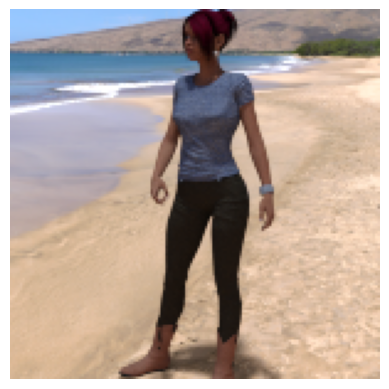

Label:  human
Previsão:  human
Probabilidade:  0.98883075


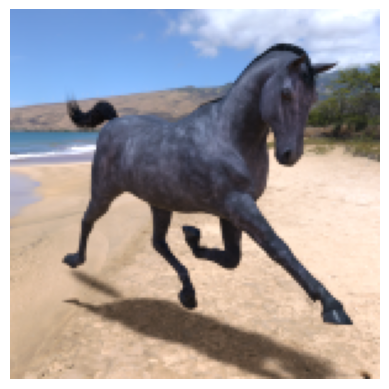

Label:  horse
Previsão:  horse
Probabilidade:  0.0007126195


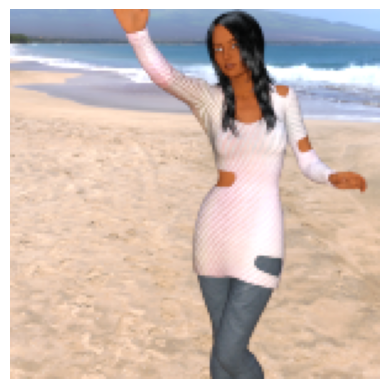

Label:  human
Previsão:  human
Probabilidade:  0.9624182


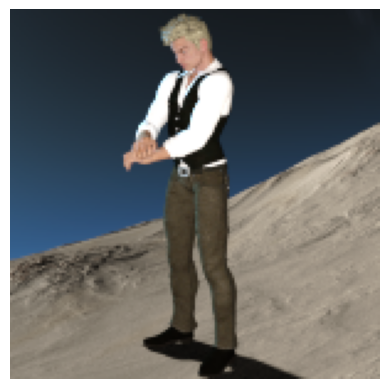

Label:  human
Previsão:  human
Probabilidade:  0.99569327


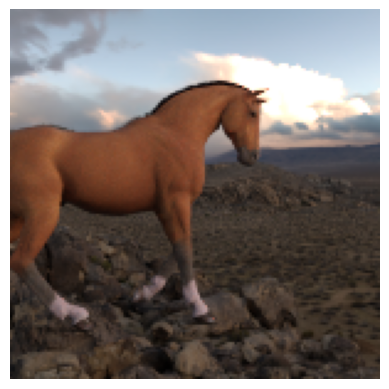

Label:  horse
Previsão:  horse
Probabilidade:  0.17605408


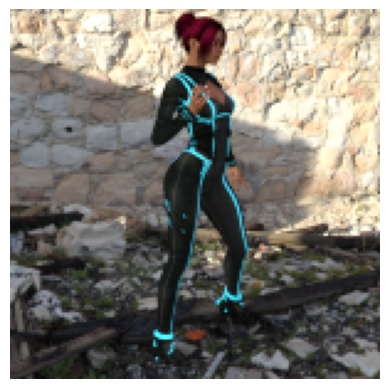

Label:  human
Previsão:  human
Probabilidade:  0.9999702


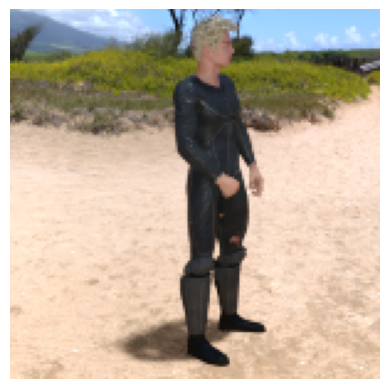

Label:  human
Previsão:  human
Probabilidade:  0.9983087


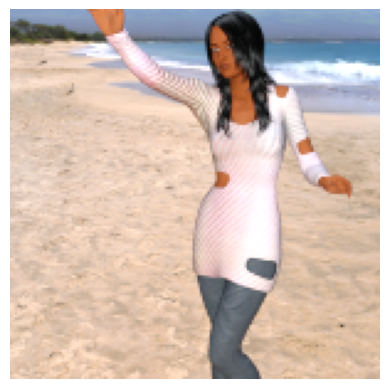

Label:  human
Previsão:  human
Probabilidade:  0.982654


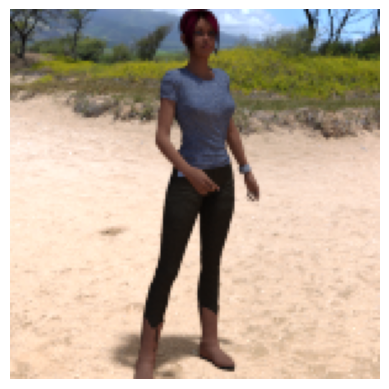

Label:  human
Previsão:  human
Probabilidade:  0.99976027


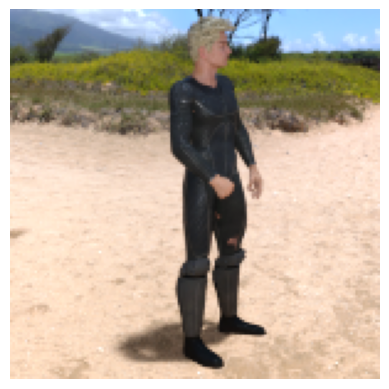

Label:  human
Previsão:  human
Probabilidade:  0.99898404


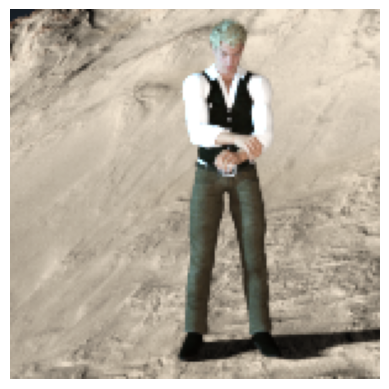

Label:  human
Previsão:  human
Probabilidade:  0.99807173


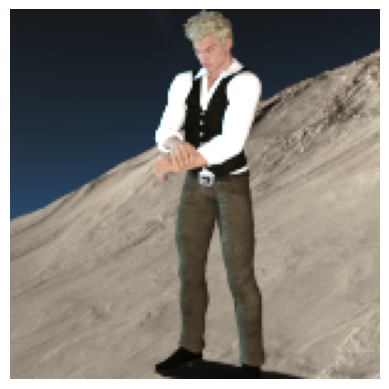

Label:  human
Previsão:  human
Probabilidade:  0.99890673


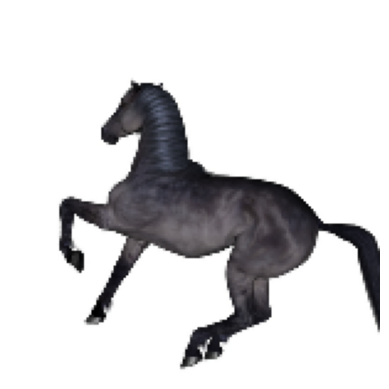

Label:  horse
Previsão:  horse
Probabilidade:  0.00013623819


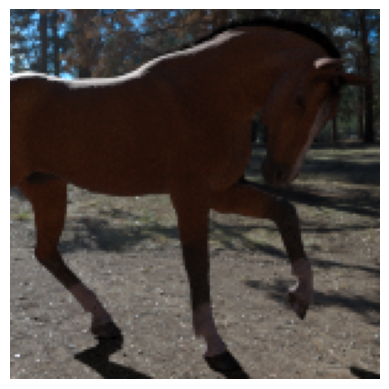

Label:  horse
Previsão:  horse
Probabilidade:  0.0004891183


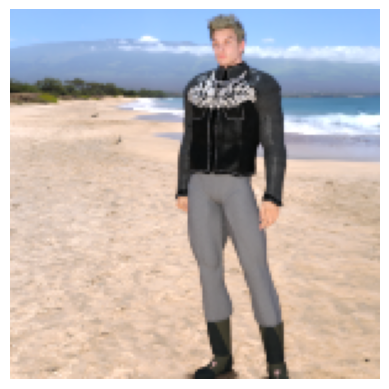

Label:  human
Previsão:  human
Probabilidade:  0.9701864


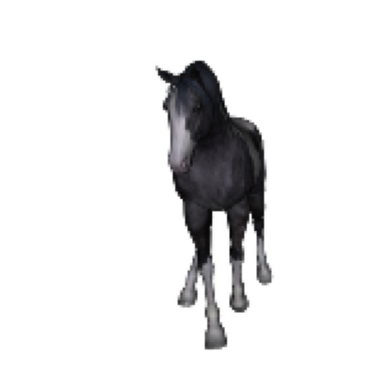

Label:  horse
Previsão:  human
Probabilidade:  0.71893793


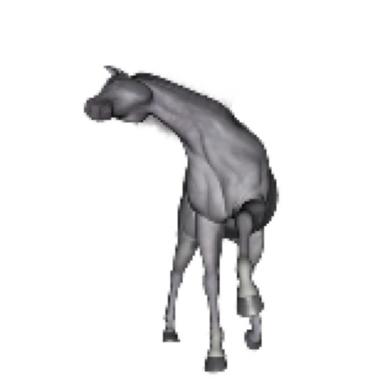

Label:  horse
Previsão:  horse
Probabilidade:  0.08445293


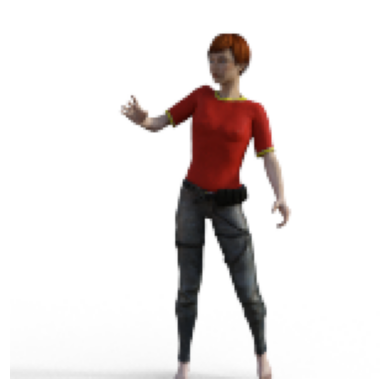

Label:  human
Previsão:  human
Probabilidade:  1.0


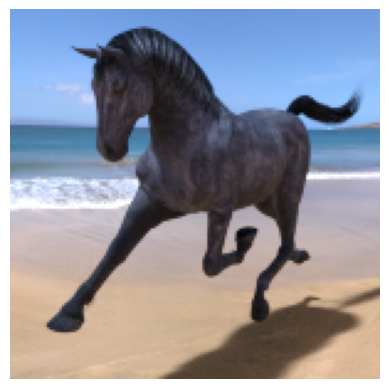

Label:  horse
Previsão:  horse
Probabilidade:  0.000368037


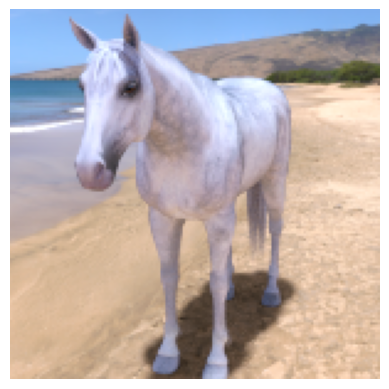

Label:  horse
Previsão:  horse
Probabilidade:  0.05030648


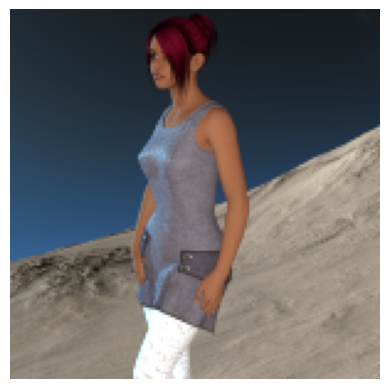

Label:  human
Previsão:  horse
Probabilidade:  0.17307703


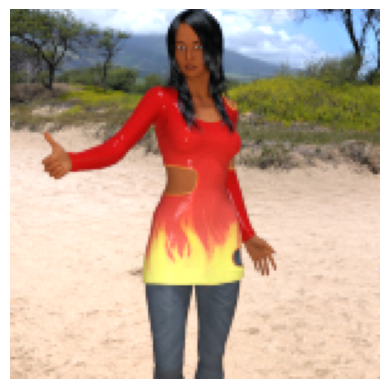

Label:  human
Previsão:  human
Probabilidade:  1.0


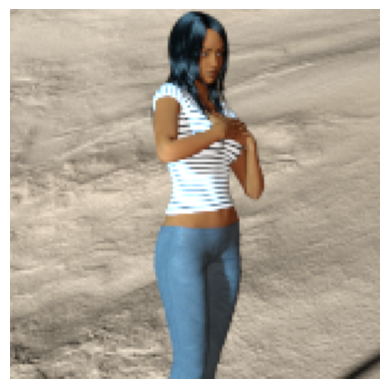

Label:  human
Previsão:  human
Probabilidade:  0.9986103


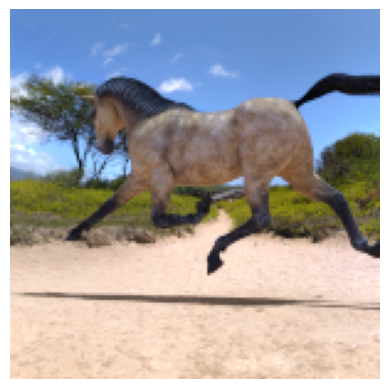

Label:  horse
Previsão:  horse
Probabilidade:  0.00041193428


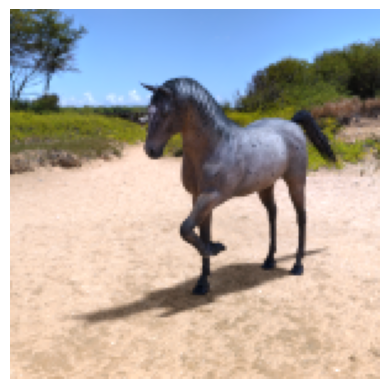

Label:  horse
Previsão:  horse
Probabilidade:  0.025486564


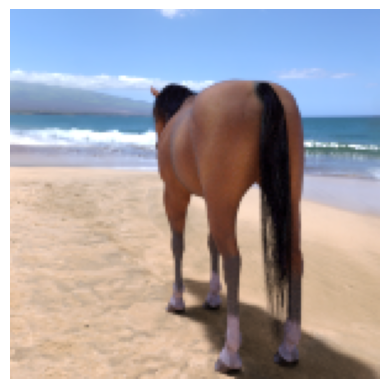

Label:  horse
Previsão:  horse
Probabilidade:  0.003169016


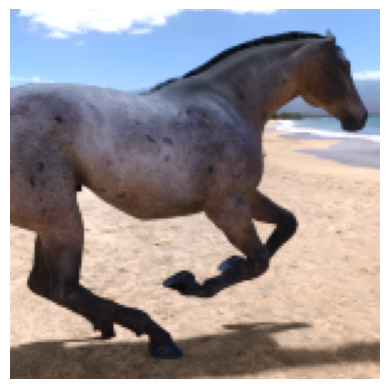

Label:  horse
Previsão:  horse
Probabilidade:  0.00082118594


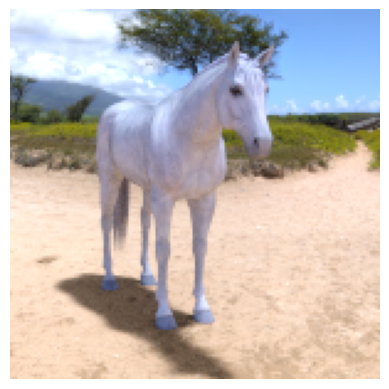

Label:  horse
Previsão:  horse
Probabilidade:  0.05751425


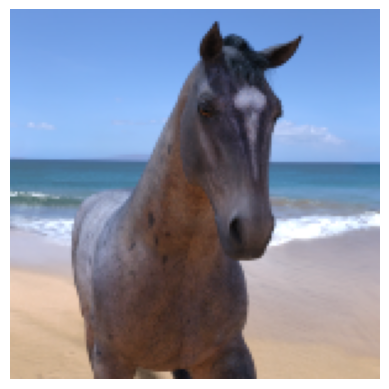

Label:  horse
Previsão:  horse
Probabilidade:  0.010341892


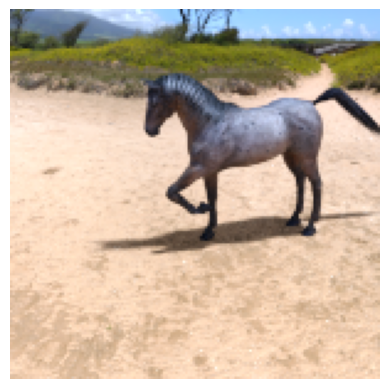

Label:  horse
Previsão:  human
Probabilidade:  0.7004702


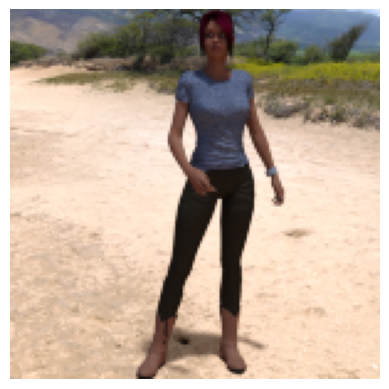

Label:  human
Previsão:  human
Probabilidade:  0.99962586


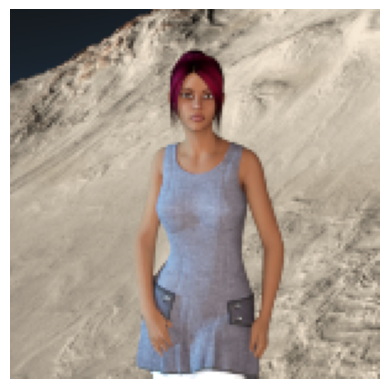

Label:  human
Previsão:  human
Probabilidade:  0.99296427


In [23]:
count = 0
y_pred = list()
y_true = list()
class_names = ['horse', 'human']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

# Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'human' if prediction >= 0.5 else 'horse'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

## 6. Avaliação do modelo de deep learning

Vamos verficar a acurácia do modelo nos dados de teste.

In [24]:
# mostra a acurácia do modelo nos dados de teste
loss, accuracy = model.evaluate(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

11/11 [==============================] - 4s 347ms/step - loss: 0.1262 - accuracy: 0.9424
Test: accuracy = 0.942363  ;  loss = 0.126219 


Conseguimos alcançar uma acurácia de 94% e uma perda de 12%. A avaliação do modelo foi ótima.

E, agora, veremos as métricas de performance do modelo no subconjunto das imagens de teste

In [25]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.90625
Precision:  0.9074900793650793
Recall:  0.90625
F1 Score:  0.9059729064039409


Podemos perceber que o resultado das métricas do conjunto de teste foi ainda melhor do que o resultado do subconjunto de teste, que alcançou 90% de acurácia.

Em seguida, vamos visualizar a matriz de confusão para identificar onde o modelo de deep learning acertou e errou na classificação do subconjunto de imagens de teste

Matriz de confusão sem normalização


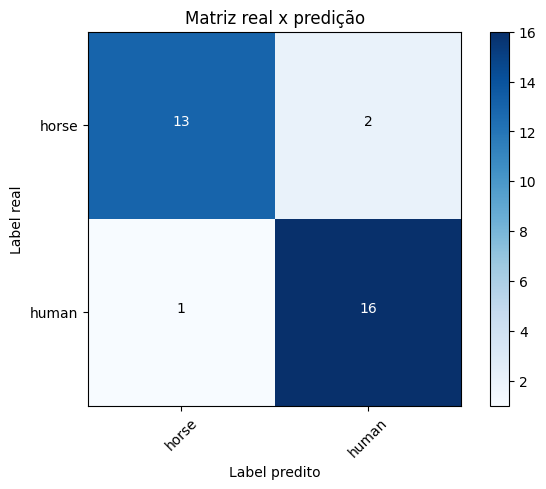

In [26]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['horse',
                               'human'],
                      normalize= False,
                      title='Matriz real x predição')

Visualizando a matriz de confusão, percebemos que, para o subconjunto de teste, o modelo errou apenas 1 do total de 17 para a classe human, e errou 2 do total de 15 para a classe horse. O modelo mostrou um ótimo desempenho.

## 7. Exportação do modelo de deep learning para posterior uso

A seguir, vamos salvar o modelo de deep learning que foi treinado

In [27]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'dataset/horsevshuman/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-23T1822.h5


## 8. Teste do modelo exportado

Carregando o modelo salvo

In [28]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-23T1822.h5 carregado com sucesso


Execução do modelo em um subconjunto de imagens de teste

1/1 [==============================] - 0s 326ms/step


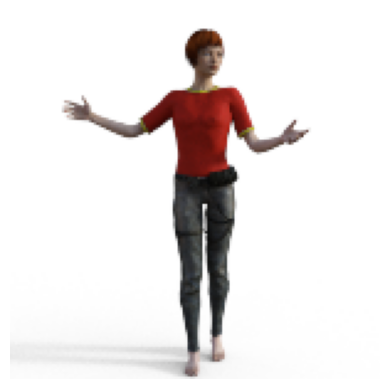

Label:  human
Previsão:  human
Probabilidade:  1.0


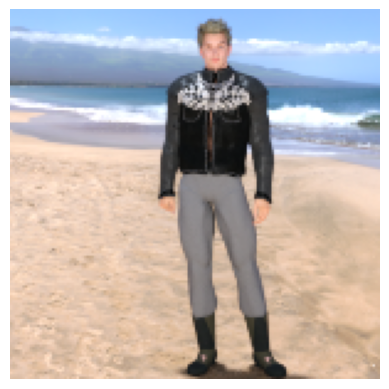

Label:  human
Previsão:  human
Probabilidade:  0.9851139


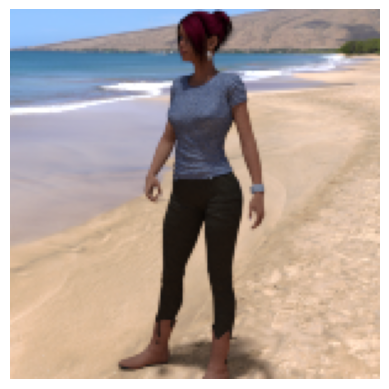

Label:  human
Previsão:  human
Probabilidade:  0.9882632


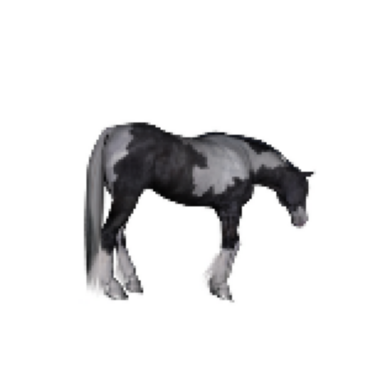

Label:  horse
Previsão:  horse
Probabilidade:  0.001619622


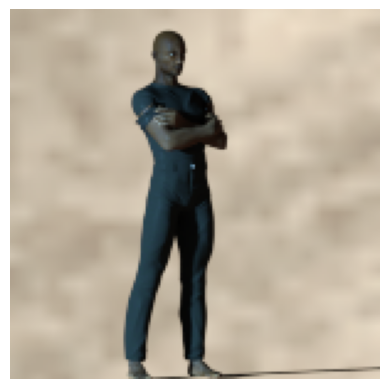

Label:  human
Previsão:  human
Probabilidade:  0.999442


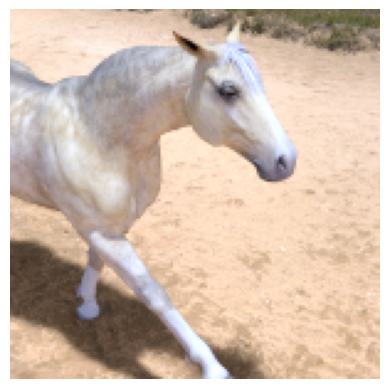

Label:  horse
Previsão:  horse
Probabilidade:  0.12447972


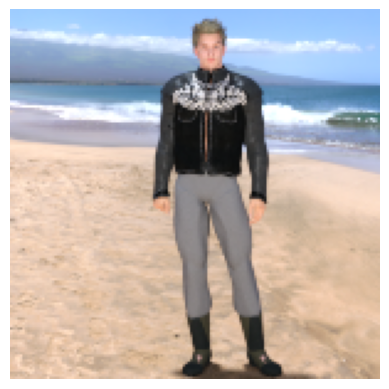

Label:  human
Previsão:  human
Probabilidade:  0.99075013


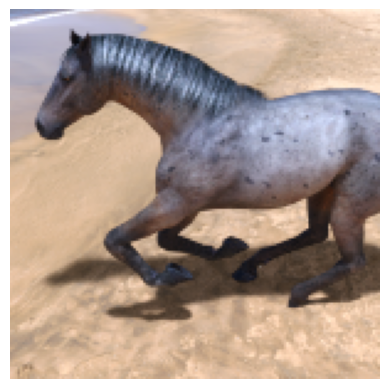

Label:  horse
Previsão:  horse
Probabilidade:  0.0056735063


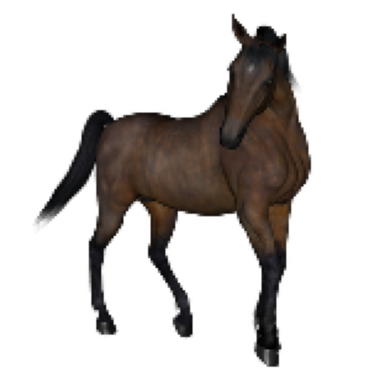

Label:  horse
Previsão:  horse
Probabilidade:  3.4524708e-06


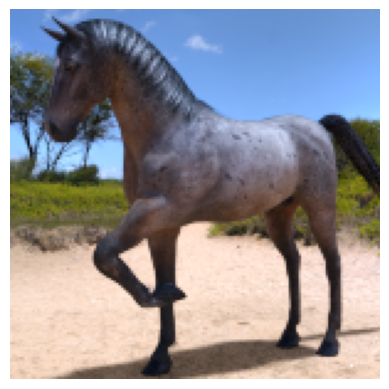

Label:  horse
Previsão:  horse
Probabilidade:  2.497221e-05


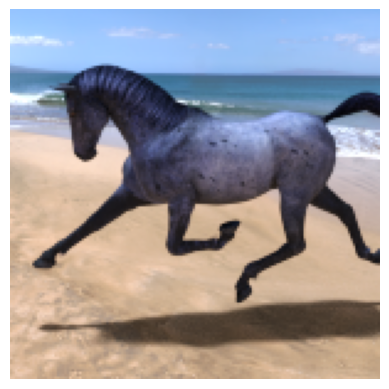

Label:  horse
Previsão:  horse
Probabilidade:  7.667167e-05


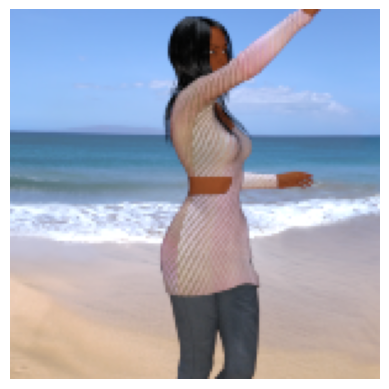

Label:  human
Previsão:  horse
Probabilidade:  0.26238537


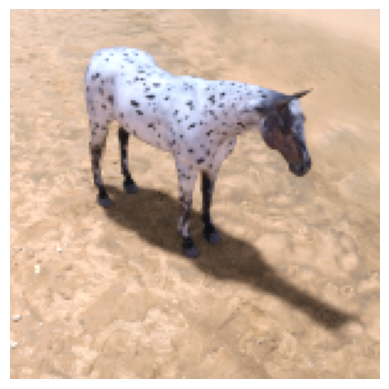

Label:  horse
Previsão:  horse
Probabilidade:  0.1787717


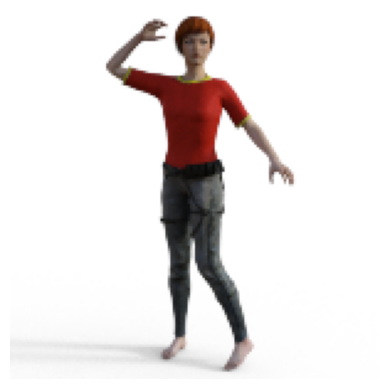

Label:  human
Previsão:  human
Probabilidade:  1.0


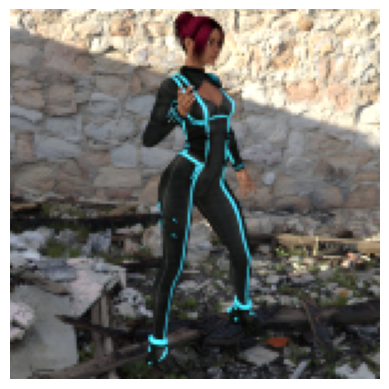

Label:  human
Previsão:  human
Probabilidade:  0.99998444


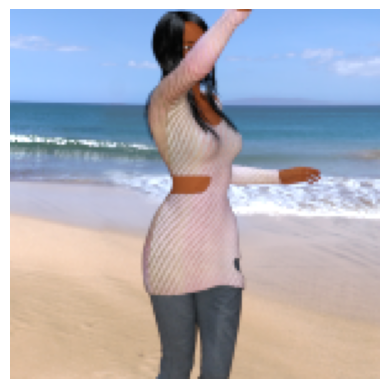

Label:  human
Previsão:  horse
Probabilidade:  0.3296726


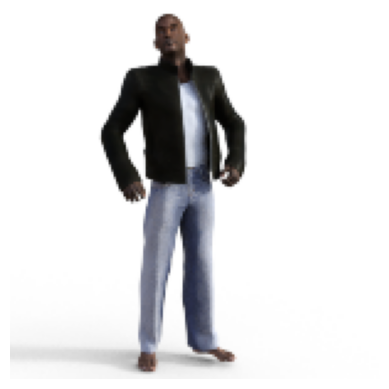

Label:  human
Previsão:  human
Probabilidade:  0.9996718


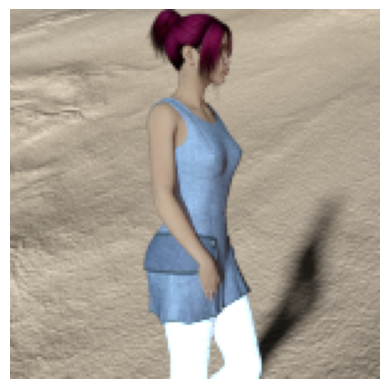

Label:  human
Previsão:  human
Probabilidade:  0.9312602


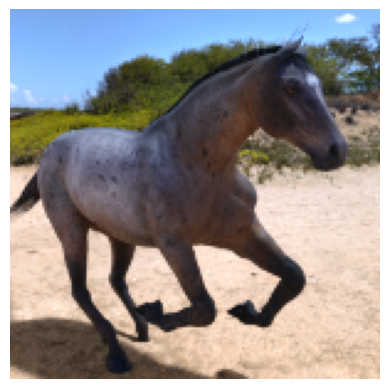

Label:  horse
Previsão:  horse
Probabilidade:  0.0016630786


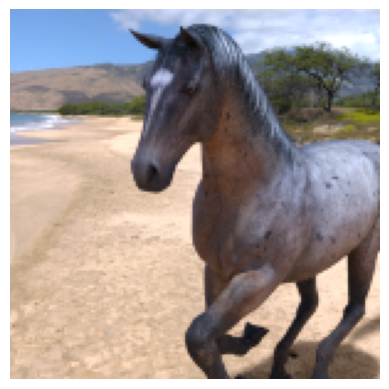

Label:  horse
Previsão:  horse
Probabilidade:  0.21411252


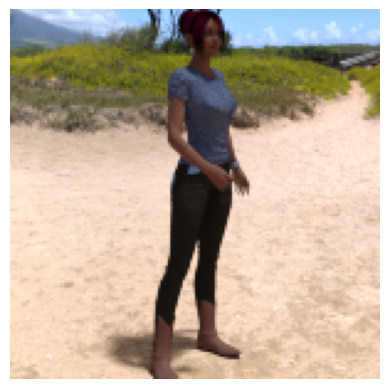

Label:  human
Previsão:  human
Probabilidade:  0.99934673


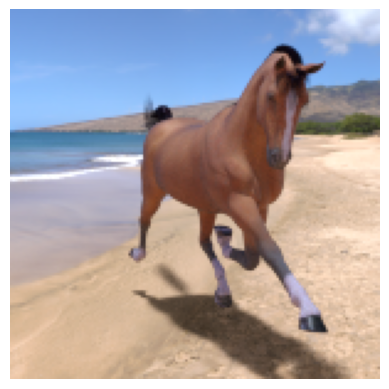

Label:  horse
Previsão:  horse
Probabilidade:  0.018502848


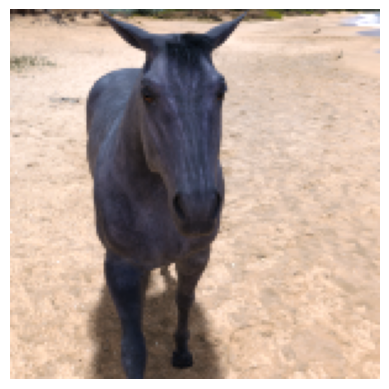

Label:  horse
Previsão:  horse
Probabilidade:  0.3649359


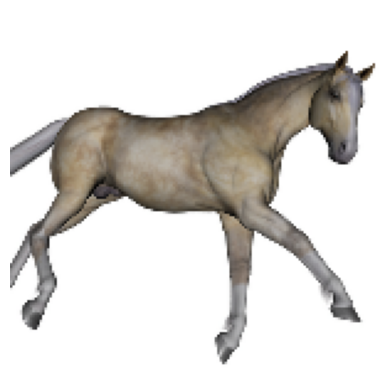

Label:  horse
Previsão:  horse
Probabilidade:  0.0017819239


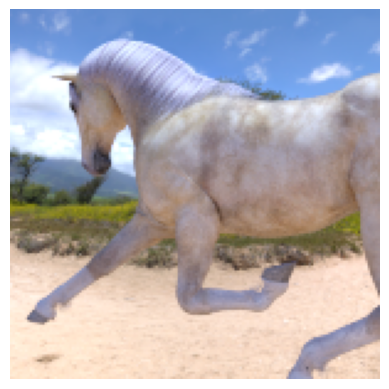

Label:  horse
Previsão:  horse
Probabilidade:  0.006915746


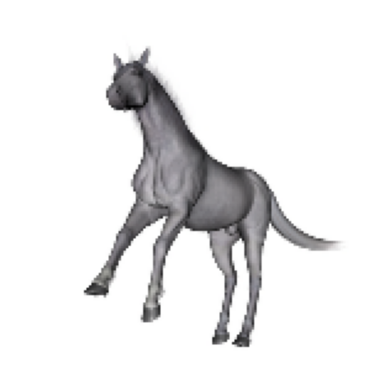

Label:  horse
Previsão:  horse
Probabilidade:  0.04618238


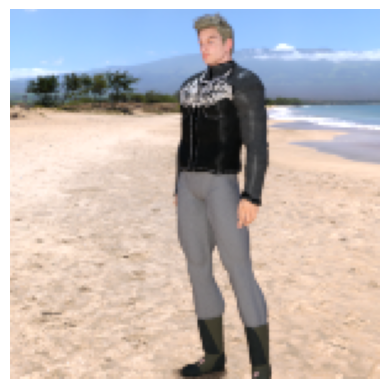

Label:  human
Previsão:  human
Probabilidade:  0.9924147


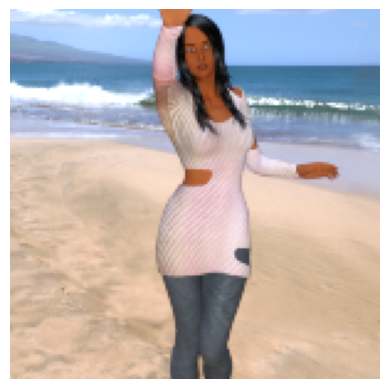

Label:  human
Previsão:  human
Probabilidade:  0.88702863


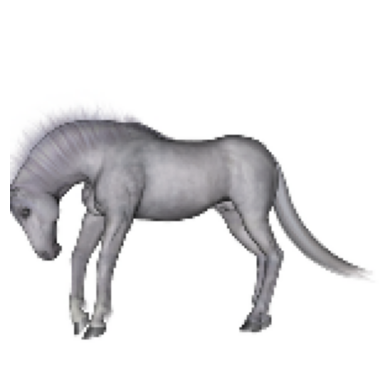

Label:  horse
Previsão:  horse
Probabilidade:  0.002196793


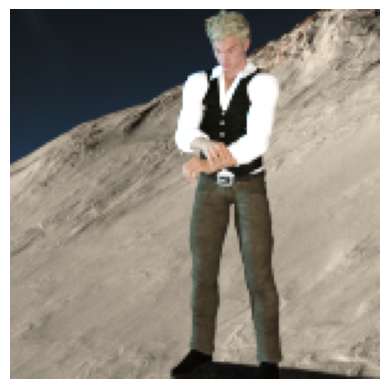

Label:  human
Previsão:  human
Probabilidade:  0.9948734


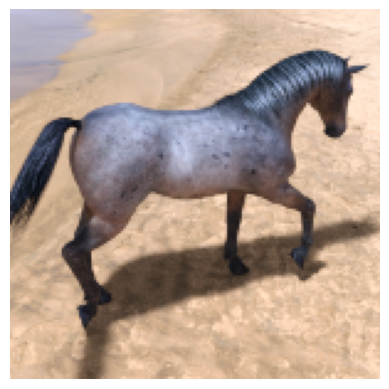

Label:  horse
Previsão:  horse
Probabilidade:  0.0006304841


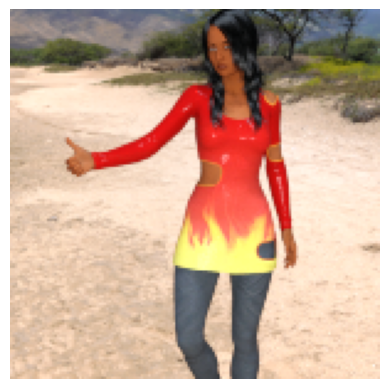

Label:  human
Previsão:  human
Probabilidade:  1.0


In [29]:
count = 0
y_pred = list()
y_true = list()
class_names = ['horse', 'human']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'human' if prediction >= 0.5 else 'horse'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)